# Analysis of Google Play Store Apps

Google's Android OS is the most popular and most widely used in all the smartphones . Every day ,the demand for Android developers is growing with a number of android apps being created and made available in the play store , the official download site for all the android apps . This dataset provides information on the android apps available in the play store along with the user reviews . The analysis will focus on broadly providing insights on the variety of apps available , user rating , sentiment of the customers .

If you like my kernel , pls leave your comments/upvote.

### Loading the required libraries and the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import os
import re
import functools

pd.options.display.float_format = "{:.2f}".format

# Standard plotly imports
import plotly_express as px
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

os.listdir()

['.ipynb_checkpoints',
 'googleplaystore.csv',
 'googleplaystore_user_reviews.csv',
 'license.txt',
 'Script.ipynb']

In [2]:
kaggle=0
if kaggle==0:
    store=pd.read_csv('googleplaystore.csv')
    review=pd.read_csv('googleplaystore_user_reviews.csv')
else:
    store=pd.read_csv('../input/googleplaystore.csv')
    review=pd.read_csv('../input/googleplaystore_user_reviews.csv')

### Data Cleaning

The number of rows and columns of the dataset is given as follows,

In [3]:
print(f'Shape of the google playstore data:{store.shape}')
print(f'Shape of the user reviews data:{review.shape}')

Shape of the google playstore data:(10841, 13)
Shape of the user reviews data:(64295, 5)


Thus we have 10,841 rows and 13 columns in the playstore dataset and 64,295 rows and 5 columns in the userreviews dataset.The columns and their datatype is obtained as follows,

In [4]:
review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64295 entries, 0 to 64294
Data columns (total 5 columns):
App                       64295 non-null object
Translated_Review         37427 non-null object
Sentiment                 37432 non-null object
Sentiment_Polarity        37432 non-null float64
Sentiment_Subjectivity    37432 non-null float64
dtypes: float64(2), object(3)
memory usage: 2.5+ MB


In [5]:
store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
App               10841 non-null object
Category          10841 non-null object
Rating            9367 non-null float64
Reviews           10841 non-null object
Size              10841 non-null object
Installs          10841 non-null object
Type              10840 non-null object
Price             10841 non-null object
Content Rating    10840 non-null object
Genres            10841 non-null object
Last Updated      10841 non-null object
Current Ver       10833 non-null object
Android Ver       10838 non-null object
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


* From the information , we find that there are null values in columns rating ,type,current ver and android ver in play store data where as there are null values in columns translated review,sentiment , sentiment polarity and sentiment subjectivity in reviews data.

* From the datatype , we understand that even numeric columns like reviews , size,installs , price are all of object datatype .On manually looking at the data , we understand that there is one row which had a column jump and hence the contents changed . Lets check that row.

In [6]:
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame"]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
10472,Life Made WI-Fi Touchscreen Photo Frame,1.9,19.0,3.0M,"1,000+",Free,0,Everyone,NaN,"February 11, 2018",1.0.19,4.0 and up,NaN


It is obvious that the category column should have been missing and the preceding column values have jumped ahead.Lets define a category for this app and set things right .

In [3]:
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Category']='PHOTOGRAPHY'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Rating']='1.9'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Reviews']='19'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Size']='3.0M'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Installs']='1,000+'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Type']='Free'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Price']='0'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Content Rating']='Everyone'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Genres']='Photography'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Last Updated']='February 11, 2018'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Current Ver']='1.0.19'
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame",'Android Ver']='4.0 and up'

In [4]:
store.loc[store['App']=="Life Made WI-Fi Touchscreen Photo Frame"]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
10472,Life Made WI-Fi Touchscreen Photo Frame,PHOTOGRAPHY,1.9,19,3.0M,"1,000+",Free,0,Everyone,Photography,"February 11, 2018",1.0.19,4.0 and up


Now that we have corrected that row , lets convert the reviews column into integer datatype . Also the size and installs have "M" and "+" in them which makes them an object datatype . We replace those two and convert it into a integer datatype.

In [4]:
store['Size']=store['Size'].apply(lambda x:str(x).replace("M","") if 'M' in str(x) else x)
store['Size']=store['Size'].apply(lambda x:float(str(x).replace("k",""))/1000 if 'k' in str(x) else x)
store['Price']=store['Price'].apply(lambda x:str(x).replace("$","") if "$" in str(x) else x)
store['Installs']=store['Installs'].apply(lambda x:str(x).replace("+","") if "+" in str(x) else x)
store['Installs']=store['Installs'].apply(lambda x:str(x).replace(",","") if "," in str(x) else x)

In [5]:
store=store.astype({'Rating':'float32','Reviews':'float32','Installs':'float64','Price':'float64'})

Lets turn our focus on the missing values.

In [11]:
store.isnull().sum()

App                  0
Category             0
Rating            1474
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content Rating       0
Genres               0
Last Updated         0
Current Ver          8
Android Ver          2
dtype: int64

From this we understand that the columns rating,type,current ver and android ver have null values.Lets check one by one and decide how to impute the null values.

In [12]:
store.loc[store['Type'].isna()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
9148,Command & Conquer: Rivals,FAMILY,NaN,0.0,Varies with device,0.0,NaN,0.0,Everyone 10+,Strategy,"June 28, 2018",Varies with device,Varies with device


We find that there is one null value for Type . A quick google check indicates that it is a purchased product and hence should be imputed with "Paid" though the price value is 0.We impute that column to the app price $1.14 .

In [6]:
store.loc[store['Type'].isna(),'Price']=1.14
store.loc[store['Type'].isna(),'Type']='Paid'

In [14]:
store.loc[store['Rating'].isna()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
23,Mcqueen Coloring pages,ART_AND_DESIGN,NaN,61.0,7.0,100000.0,Free,0.00,Everyone,Art & Design;Action & Adventure,"March 7, 2018",1.0.0,4.1 and up
113,Wrinkles and rejuvenation,BEAUTY,NaN,182.0,5.7,100000.0,Free,0.00,Everyone 10+,Beauty,"September 20, 2017",8.0,3.0 and up
123,Manicure - nail design,BEAUTY,NaN,119.0,3.7,50000.0,Free,0.00,Everyone,Beauty,"July 23, 2018",1.3,4.1 and up
126,Skin Care and Natural Beauty,BEAUTY,NaN,654.0,7.4,100000.0,Free,0.00,Teen,Beauty,"July 17, 2018",1.15,4.1 and up
129,"Secrets of beauty, youth and health",BEAUTY,NaN,77.0,2.9,10000.0,Free,0.00,Mature 17+,Beauty,"August 8, 2017",2.0,2.3 and up
130,Recipes and tips for losing weight,BEAUTY,NaN,35.0,3.1,10000.0,Free,0.00,Everyone 10+,Beauty,"December 11, 2017",2.0,3.0 and up
134,"Lady adviser (beauty, health)",BEAUTY,NaN,30.0,9.9,10000.0,Free,0.00,Mature 17+,Beauty,"January 24, 2018",3.0,3.0 and up
163,Anonymous caller detection,BOOKS_AND_REFERENCE,NaN,161.0,2.7,10000.0,Free,0.00,Everyone,Books & Reference,"July 13, 2018",1.0,2.3 and up
180,SH-02J Owner's Manual (Android 8.0),BOOKS_AND_REFERENCE,NaN,2.0,7.2,50000.0,Free,0.00,Everyone,Books & Reference,"June 15, 2018",3.0,6.0 and up
185,URBANO V 02 instruction manual,BOOKS_AND_REFERENCE,NaN,114.0,7.3,100000.0,Free,0.00,Everyone,Books & Reference,"August 7, 2015",1.1,5.1 and up


Since it would be difficult to impute each of the apps with the corresponding rating though google search , we impute NA with 0 meaning not rated yet.

In [7]:
store['Rating'].fillna(0,inplace=True)

In [16]:
store.loc[store['Current Ver'].isna()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
15,Learn To Draw Kawaii Characters,ART_AND_DESIGN,3.2,55.0,2.7,5000.0,Free,0.00,Everyone,Art & Design,"June 6, 2018",NaN,4.2 and up
1553,Market Update Helper,LIBRARIES_AND_DEMO,4.1,20145.0,0.011,1000000.0,Free,0.00,Everyone,Libraries & Demo,"February 12, 2013",NaN,1.5 and up
6322,Virtual DJ Sound Mixer,TOOLS,4.2,4010.0,8.7,500000.0,Free,0.00,Everyone,Tools,"May 10, 2017",NaN,4.0 and up
6803,BT Master,FAMILY,0.0,0.0,0.222,100.0,Free,0.00,Everyone,Education,"November 6, 2016",NaN,1.6 and up
7333,Dots puzzle,FAMILY,4.0,179.0,14,50000.0,Paid,0.99,Everyone,Puzzle,"April 18, 2018",NaN,4.0 and up
7407,Calculate My IQ,FAMILY,0.0,44.0,7.2,10000.0,Free,0.00,Everyone,Entertainment,"April 3, 2017",NaN,2.3 and up
7730,UFO-CQ,TOOLS,0.0,1.0,0.237,10.0,Paid,0.99,Everyone,Tools,"July 4, 2016",NaN,2.0 and up
10342,La Fe de Jesus,BOOKS_AND_REFERENCE,0.0,8.0,0.658,1000.0,Free,0.00,Everyone,Books & Reference,"January 31, 2017",NaN,3.0 and up


We impute the rows as "varies with device" in this case

In [8]:
store['Current Ver'].fillna('Varies with device',inplace=True)

In [18]:
store.loc[store['Android Ver'].isna()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
4453,[substratum] Vacuum: P,PERSONALIZATION,4.4,230.0,11,1000.0,Paid,1.49,Everyone,Personalization,"July 20, 2018",4.4,NaN
4490,Pi Dark [substratum],PERSONALIZATION,4.5,189.0,2.1,10000.0,Free,0.00,Everyone,Personalization,"March 27, 2018",1.1,NaN


In this case also , we impute "Varies with device"

In [9]:
store['Android Ver'].fillna('Varies with device',inplace=True)

Now that all the datacleaning is done , we are ready to begin our analysis.

In [20]:
store.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159.0,19,10000.0,Free,0.0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967.0,14,500000.0,Free,0.0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510.0,8.7,5000000.0,Free,0.0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644.0,25,50000000.0,Free,0.0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967.0,2.8,100000.0,Free,0.0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [92]:
review.head()

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000


### Exploratory Data Analysis

### Distribution of Rating , Review ,Size and Installs

In [46]:
store['Rating'].describe()

count    9745.000000
mean        3.547491
std         1.571152
min         0.000000
25%         3.600000
50%         4.200000
75%         4.500000
max         5.000000
Name: Rating, dtype: float64

Text(0.5, 1.0, 'Rating - Distribution')

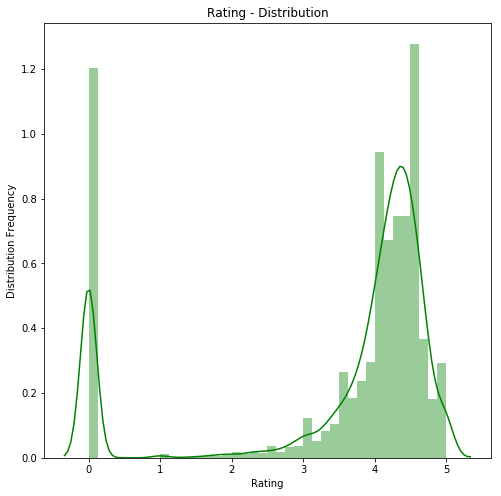

In [41]:
plt.figure(figsize=(8,8))
ax=sns.distplot(store['Rating'],bins=40,color="green")
ax.set_xlabel("Rating")
ax.set_ylabel("Distribution Frequency")
ax.set_title("Rating - Distribution")

From the plot , we understand that the distribution is multimodal having peaks at rating 0 and at 4 .There are more apps having a rating value between 3 to 4.5 .

In [144]:
store['Reviews'].describe()

count       9745.00
mean      238125.78
std      1934377.50
min            0.00
25%           26.00
50%         1016.00
75%        30693.00
max     78158304.00
Name: Reviews, dtype: float64

Text(0.5, 1.0, 'Review - Distribution')

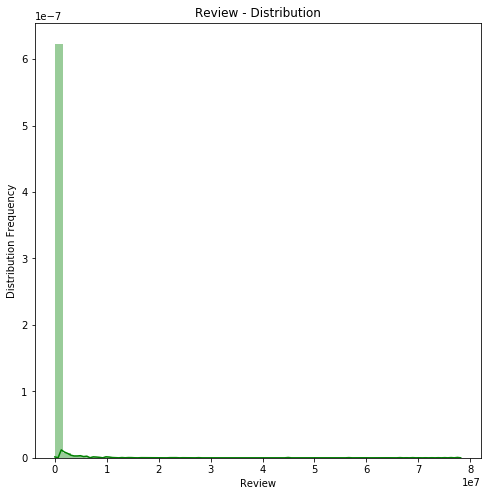

In [44]:
plt.figure(figsize=(8,8))
ax=sns.distplot(store['Reviews'],color="green")
ax.set_xlabel("Review")
ax.set_ylabel("Distribution Frequency")
ax.set_title("Review - Distribution")

It is not surprising at all to see a distribution of the reviews tailed towards the right since the descriptive statistics gave a clear indication where we find that almost 75 % of the data take up values of magnitude till 10^4.The standard deviation of the variable is very high - in the magnitude of 10^6 .Taking the log of the variable and plotting the distribution,

Text(0.5, 1.0, 'Review -Log  Distribution')

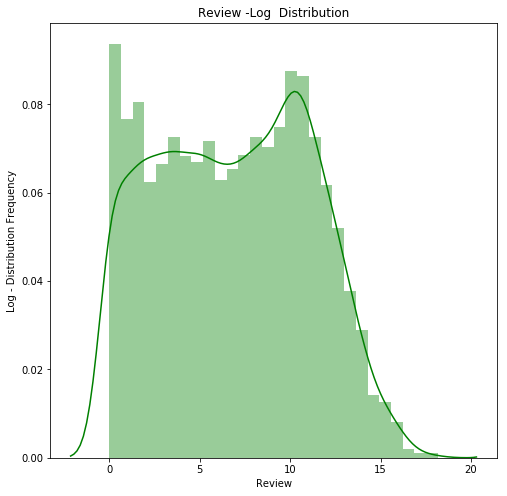

In [49]:
plt.figure(figsize=(8,8))
ax=sns.distplot(np.log1p(store['Reviews']),color="green")
ax.set_xlabel("Review")
ax.set_ylabel("Log - Distribution Frequency")
ax.set_title("Review -Log  Distribution")

The distribution is not very symmetric but far better than the previous graph without the log transformation.

In [11]:
store.loc[store['Size']!="Varies with device",['Size']].astype('float32').describe()

,Size
count,9146.00
mean,21.51
std,22.59
min,0.01
25%,4.90
50%,13.00
75%,30.00
max,100.00


Text(0.5, 1.0, 'Size -Distribution')

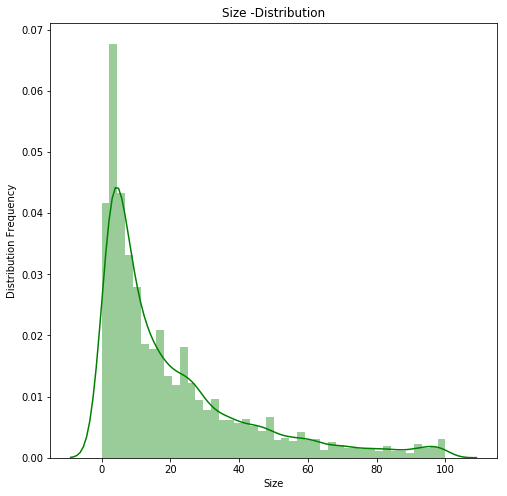

In [56]:
plt.figure(figsize=(8,8))
ax=sns.distplot(store.loc[store['Size']!="Varies with device",['Size']].astype('float32'),color="green")
ax.set_xlabel("Size")
ax.set_ylabel("Distribution Frequency")
ax.set_title("Size -Distribution")

The distribution for the size seems to be skewed towards the right .The mode is between 0 - 20 MB .

In [145]:
store['Installs'].describe()

count         9745.00
mean       8208079.98
std       55277789.84
min              0.00
25%           1000.00
50%         100000.00
75%        1000000.00
max     1000000000.00
Name: Installs, dtype: float64

Text(0.5, 1.0, 'Installs -Distribution')

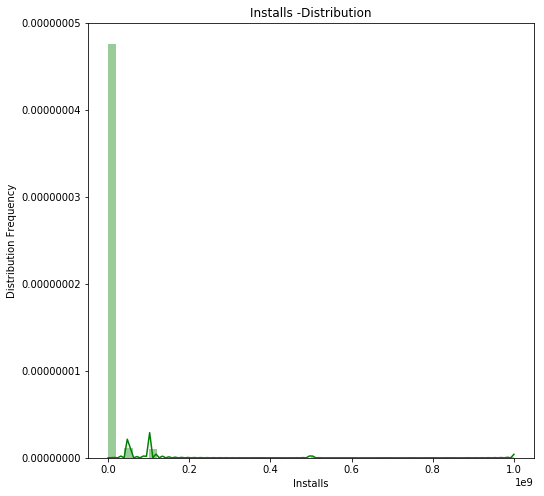

In [147]:
plt.figure(figsize=(8,8))
ax=sns.distplot(store['Installs'],color="green")
ax.set_xlabel("Installs")
ax.set_ylabel("Distribution Frequency")
ax.get_yaxis().get_major_formatter().set_scientific(False)
ax.set_title("Installs -Distribution")

The plot is highly skewed and provides an insight from the descriptive statistics that there have been only few apps which has seen the maximum number of downloads . 

### Apps and Category

Lets check how many apps are present in the dataset.

In [21]:
store['App'].nunique()

9660

There are 9660 unique apps present in the dataset.Lets check out the apps that are repeated more than once.

In [22]:
pd.concat(g for _,g in store.groupby('App') if len(g)>1)

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1393,10 Best Foods for You,HEALTH_AND_FITNESS,4.0,2490.0,3.8,500000.0,Free,0.00,Everyone 10+,Health & Fitness,"February 17, 2017",1.9,2.3.3 and up
1407,10 Best Foods for You,HEALTH_AND_FITNESS,4.0,2490.0,3.8,500000.0,Free,0.00,Everyone 10+,Health & Fitness,"February 17, 2017",1.9,2.3.3 and up
2322,1800 Contacts - Lens Store,MEDICAL,4.7,23160.0,26,1000000.0,Free,0.00,Everyone,Medical,"July 27, 2018",7.4.1,5.0 and up
2543,1800 Contacts - Lens Store,MEDICAL,4.7,23160.0,26,1000000.0,Free,0.00,Everyone,Medical,"July 27, 2018",7.4.1,5.0 and up
2256,2017 EMRA Antibiotic Guide,MEDICAL,4.4,12.0,3.8,1000.0,Paid,16.99,Everyone,Medical,"January 27, 2017",1.0.5,4.0.3 and up
2385,2017 EMRA Antibiotic Guide,MEDICAL,4.4,12.0,3.8,1000.0,Paid,16.99,Everyone,Medical,"January 27, 2017",1.0.5,4.0.3 and up
1337,21-Day Meditation Experience,HEALTH_AND_FITNESS,4.4,11506.0,15,100000.0,Free,0.00,Everyone,Health & Fitness,"August 2, 2018",3.0.0,4.1 and up
1434,21-Day Meditation Experience,HEALTH_AND_FITNESS,4.4,11506.0,15,100000.0,Free,0.00,Everyone,Health & Fitness,"August 2, 2018",3.0.0,4.1 and up
3083,365Scores - Live Scores,SPORTS,4.6,666521.0,25,10000000.0,Free,0.00,Everyone,Sports,"July 29, 2018",5.5.9,4.1 and up
5415,365Scores - Live Scores,SPORTS,4.6,666246.0,25,10000000.0,Free,0.00,Everyone,Sports,"July 29, 2018",5.5.9,4.1 and up


In [23]:
pd.concat(g for _,g in store.groupby('App') if len(g)>1)['App'].nunique()

798

In [24]:
pd.concat(g for _,g in store.groupby('App') if len(g)>1)['App'].shape

(1979,)

From the output of the data, we understand that there are 798 apps out of 9660 apps which seems to have been duplicated ( eg. 10 best food for you , 1800 contacts-Lens store) whereas there are also rows for the same app but having different review count(eg.365Scores-Live Scores,8 ball pool) or category(eg.A&E - Watch full episodes of TV shows) .To simplify things for further analysis , I remove the duplicates , keep the row for which the review count has been higher in case if there are different review counts .

In [10]:
## Removing the duplicates:
store = store.drop_duplicates()

In [11]:
## Check the number of rows,
store.shape

(10358, 13)

In [12]:
## Get the rows having the maximum review count ,
#temp=store.loc[store.groupby(['App'])['Reviews'].idxmax()]
store=store.loc[store.groupby(['App','Category'])['Reviews'].idxmax()]

In [28]:
store.shape

(9745, 13)

In [14]:
## Check the apps having assigned in more than 1 category 
## Taken from my kernel on Olympics - https://www.kaggle.com/gsdeepakkumar/gold-hunters
multi_cat=store.groupby('App').apply(lambda x:x['Category'].unique()).to_frame().reset_index()
multi_cat.columns=['App','Categories']
multi_cat['Count']=[len(c) for c in multi_cat['Categories']]

In [30]:
multi_cat[multi_cat['Count']>1].sort_values('Count',ascending=False)

,App,Categories,Count
101,8 Ball Pool,"[GAME, SPORTS]",2
6432,My Talking Angela,"[FAMILY, GAME]",2
7044,Plants vs. Zombies FREE,"[FAMILY, GAME]",2
6927,Period Tracker,"[HEALTH_AND_FITNESS, MEDICAL]",2
6906,Peak – Brain Games & Training,"[EDUCATION, FAMILY]",2
6819,PBS KIDS Video,"[EDUCATION, FAMILY]",2
6628,No.Draw - Colors by Number 2018,"[ENTERTAINMENT, FAMILY]",2
6601,Nick,"[ENTERTAINMENT, FAMILY]",2
6556,Netflix,"[ENTERTAINMENT, FAMILY]",2
6434,My Talking Tom,"[FAMILY, GAME]",2


Lets check the different type of categories represented in the dataset.

In [31]:
store['Category'].nunique()

33

There are 33 unique categories . What are they?

In [32]:
store['Category'].unique()

array(['SPORTS', 'SOCIAL', 'COMICS', 'TOOLS', 'COMMUNICATION',
       'NEWS_AND_MAGAZINES', 'HEALTH_AND_FITNESS', 'FAMILY',
       'BOOKS_AND_REFERENCE', 'LIFESTYLE', 'BUSINESS', 'SHOPPING',
       'MEDICAL', 'GAME', 'FINANCE', 'PERSONALIZATION', 'PHOTOGRAPHY',
       'TRAVEL_AND_LOCAL', 'DATING', 'PRODUCTIVITY', 'ART_AND_DESIGN',
       'FOOD_AND_DRINK', 'VIDEO_PLAYERS', 'HOUSE_AND_HOME',
       'MAPS_AND_NAVIGATION', 'ENTERTAINMENT', 'EVENTS', 'EDUCATION',
       'AUTO_AND_VEHICLES', 'WEATHER', 'BEAUTY', 'LIBRARIES_AND_DEMO',
       'PARENTING'], dtype=object)

### How many apps are represented for each category ?

In [15]:
category_app=store.groupby('Category')['App'].nunique().sort_values(ascending=False).to_frame().reset_index()
category_app.columns=['Category','Total']
category_app['Perc']=category_app['Total']/sum(category_app['Total'])
category_app

,Category,Total,Perc
0,FAMILY,1909,0.20
1,GAME,960,0.10
2,TOOLS,829,0.09
3,BUSINESS,420,0.04
4,MEDICAL,396,0.04
5,PERSONALIZATION,376,0.04
6,PRODUCTIVITY,374,0.04
7,LIFESTYLE,369,0.04
8,FINANCE,345,0.04
9,SPORTS,327,0.03


Family apps dominate the store dataset with 1909 apps which contributes to 19 % of the total apps represented in the dataset . 9 % of the apps belong to game category followed closely by the tools category . Beauty ,comics apps are represented in small numbers .

### What is the average rating for each of the categories ?

In [94]:
store.groupby('Category')['Rating'].mean().sort_values(ascending=False)


Category
EDUCATION              4.327731
ART_AND_DESIGN         4.153125
ENTERTAINMENT          4.135294
GAME                   4.039166
COMICS                 4.032143
PHOTOGRAPHY            3.882624
WEATHER                3.867089
SHOPPING               3.769802
FAMILY                 3.693662
VIDEO_PLAYERS          3.675000
MAPS_AND_NAVIGATION    3.635878
SOCIAL                 3.607531
FINANCE                3.602609
AUTO_AND_VEHICLES      3.598824
HEALTH_AND_FITNESS     3.594792
PARENTING              3.583333
TOOLS                  3.509047
FOOD_AND_DRINK         3.500893
HOUSE_AND_HOME         3.477027
TRAVEL_AND_LOCAL       3.474886
PERSONALIZATION        3.433511
BEAUTY                 3.390566
SPORTS                 3.380122
PRODUCTIVITY           3.366845
COMMUNICATION          3.351899
LIFESTYLE              3.339024
NEWS_AND_MAGAZINES     3.310236
BOOKS_AND_REFERENCE    3.307658
LIBRARIES_AND_DEMO     3.183333
EVENTS                 3.118750
DATING                 3.111111

The average rating for apps in education category is 4.32 which is closely followed by art and design , entertainment .Lets check the average rating by the type of app - free and paid.

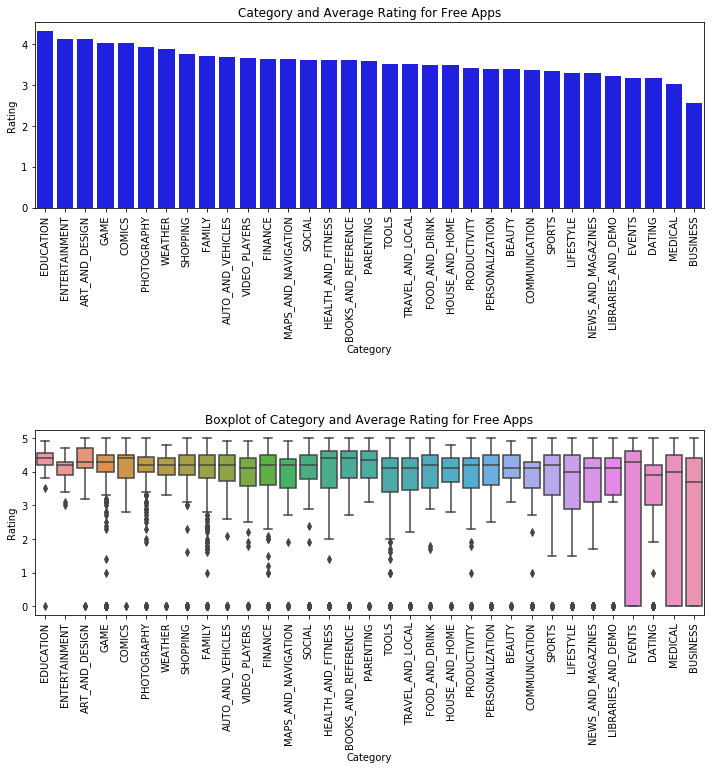

In [128]:
avg_rating=store.groupby(['Category','Type'])['Rating'].mean().sort_values(ascending=False).to_frame().reset_index()
plt.figure(figsize=(12,7))
plt.subplot(211)
ax=sns.barplot(x='Category',y='Rating',data=avg_rating.loc[avg_rating['Type']=='Free'],color="blue")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Rating')
ax.set_title("Category and Average Rating for Free Apps")
plt.subplot(212)
ax=sns.boxplot(x='Category',y='Rating',data=store.loc[store['Type']=='Free'],order=avg_rating.loc[avg_rating['Type']=='Free','Category'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Rating')
ax.set_title("Boxplot of Category and Rating for Free Apps")

plt.subplots_adjust(wspace = 0.8, hspace = 1.2,top = 1.3)

plt.show()


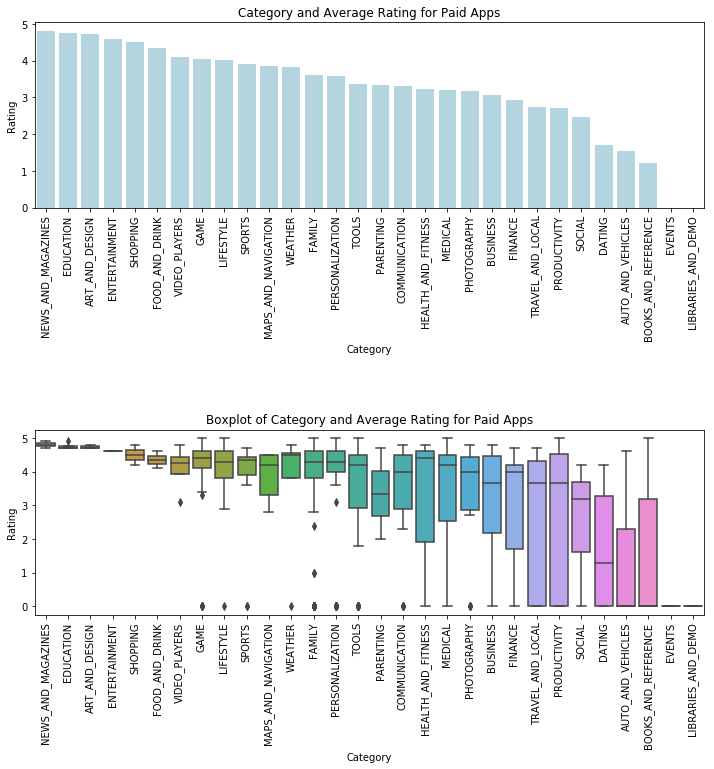

In [129]:
plt.figure(figsize=(12,7))
plt.subplot(211)
ax=sns.barplot(x='Category',y='Rating',data=avg_rating.loc[avg_rating['Type']=='Paid'],color="lightblue")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Rating')
ax.set_title("Category and Average Rating for Paid Apps")

plt.subplot(212)
ax=sns.boxplot(x='Category',y='Rating',data=store.loc[store['Type']=='Paid'],order=avg_rating.loc[avg_rating['Type']=='Paid','Category'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Rating')
ax.set_title("Boxplot of Category and Rating for Paid Apps")

plt.subplots_adjust(wspace = 0.8, hspace = 1.2,top = 1.3)

plt.show()

* From the two plots, we see that there is a significant difference in the ratings and the category . While news and magazines is top rated in paid category ,education is the top rated in free apps . There is no difference in the 2nd and 3rd positions though.
* Education is the top rated category in free apps 
* While the free app category rating tends to atleast have a rating of above ~2.5 for all the categories ,for paid apps the rating is also 0 for the categories events , libraries and demo.
* From the boxplot , it is understood that while there are many categories for which the apps have been rated 0 in free apps , there are only few such apps in paid category.
* In the paid apps category , the boxplot distibution is very thin for top apps . 

### What is the average download for each of the categories ?

In the similar lines as that of category ratings , we analyse the average installs for the app categories by the type .

In [143]:

store.groupby('Category')['Installs'].mean().sort_values(ascending=False)


Category
COMMUNICATION         34934418.52
VIDEO_PLAYERS         23975016.59
SOCIAL                22961790.38
ENTERTAINMENT         20722156.86
PHOTOGRAPHY           16518257.64
PRODUCTIVITY          15489549.11
GAME                  14550962.93
TRAVEL_AND_LOCAL      13218662.77
TOOLS                  9774151.89
NEWS_AND_MAGAZINES     9327628.98
BOOKS_AND_REFERENCE    7504367.46
SHOPPING               6932419.73
FAMILY                 4654605.82
WEATHER                4570892.66
PERSONALIZATION        4075783.99
HEALTH_AND_FITNESS     3972300.39
SPORTS                 3964753.82
MAPS_AND_NAVIGATION    3841846.49
EDUCATION              2965983.19
FOOD_AND_DRINK         1891060.28
ART_AND_DESIGN         1786532.81
BUSINESS               1659916.35
LIFESTYLE              1365375.44
FINANCE                1319851.40
HOUSE_AND_HOME         1313681.91
DATING                  824129.28
COMICS                  803234.82
LIBRARIES_AND_DEMO      630903.69
AUTO_AND_VEHICLES       625061.31
PAREN

The average downloads is higher for Communication with 3.4 Mn downloads .Video players stands second with 2.3 Mn downloads .While the difference between first and second downloads is high ,the difference is not much between the second and third categories.

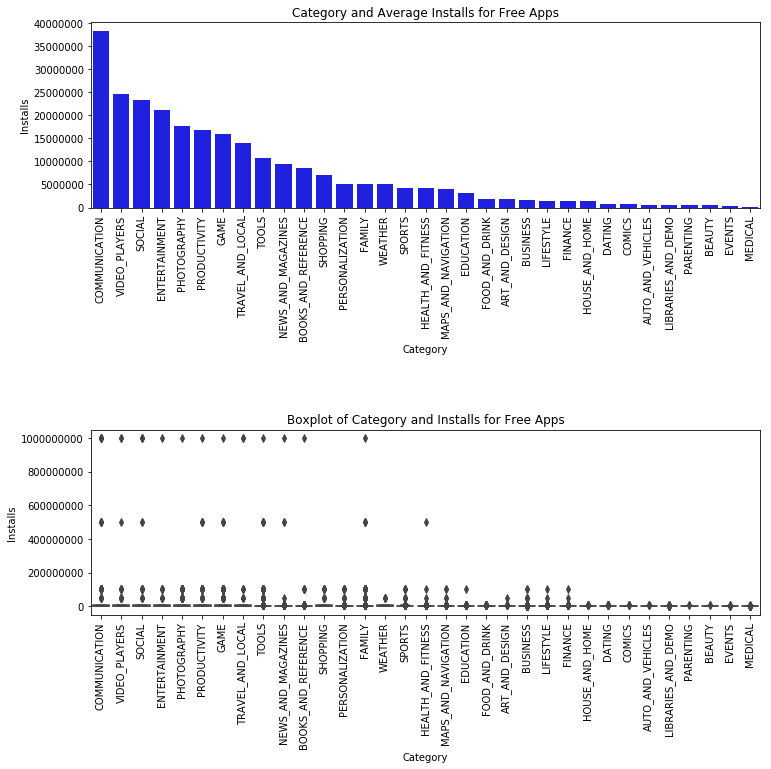

In [137]:
avg_installs=store.groupby(['Category','Type'])['Installs'].mean().sort_values(ascending=False).to_frame().reset_index()
plt.figure(figsize=(12,7))
plt.subplot(211)
ax=sns.barplot(x='Category',y='Installs',data=avg_installs.loc[avg_installs['Type']=='Free'],color="blue")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Installs')
ax.get_yaxis().get_major_formatter().set_scientific(False)
ax.set_title("Category and Average Installs for Free Apps")

plt.subplot(212)
ax=sns.boxplot(x='Category',y='Installs',data=store.loc[store['Type']=='Free'],order=avg_installs.loc[avg_installs['Type']=='Free','Category'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Installs')
ax.get_yaxis().get_major_formatter().set_scientific(False)
ax.set_title("Boxplot of Category and Installs for Free Apps")

plt.subplots_adjust(wspace = 0.8, hspace = 1.2,top = 1.3)

plt.show()


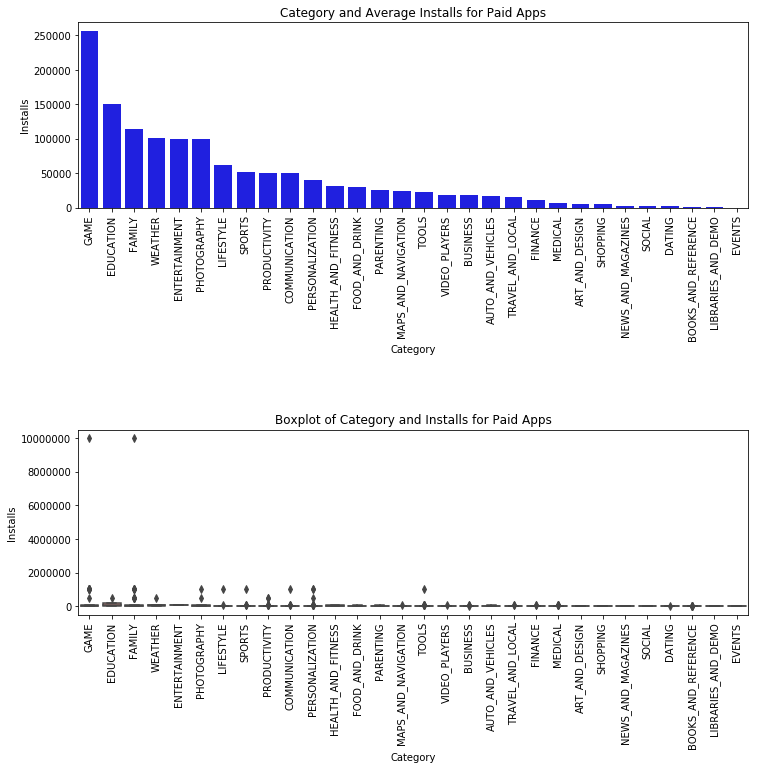

In [136]:

plt.figure(figsize=(12,7))
plt.subplot(211)
ax=sns.barplot(x='Category',y='Installs',data=avg_installs.loc[avg_installs['Type']=='Paid'],color="blue")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Installs')
ax.get_yaxis().get_major_formatter().set_scientific(False)
ax.set_title("Category and Average Installs for Paid Apps")

plt.subplot(212)
ax=sns.boxplot(x='Category',y='Installs',data=store.loc[store['Type']=='Paid'],order=avg_installs.loc[avg_installs['Type']=='Paid','Category'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel('Category')
ax.set_ylabel('Installs')
ax.get_yaxis().get_major_formatter().set_scientific(False)
ax.set_title("Boxplot of Category and Installs for Paid Apps")

plt.subplots_adjust(wspace = 0.8, hspace = 1.2,top = 1.3)

plt.show()


* The average number of installs for a free app is higher than the average number of installs for a paid app.While the avg download is about 3.5 Mn for a free app , for a paid app it is 0.25 Mn .
* There is a significant difference in the downloads between the free and a paid app . While Communication , video players and social are top downloaded in free app category , game ,education and family categories are most downloaded in the paid category.
* The free type of downloads is most dominated by outliers for each of the categories where as there are only few outliers for the categories in paid type of downloads

### Which apps are top rated , most downloaded in each of the top categories - FAMILY,GAME,TOOLS,BUSINESS,MEDICAL ?

For this analysis , inorder to get accurate results , we consider only the rating of the apps which have exceeded the average download for that category .

In [153]:
family_app=store[store['Installs']>=4654605].loc[store['Category']=='FAMILY'].sort_values(by='Rating',ascending=False)[0:9]
family_app[['App','Rating','Installs','Type']]

,App,Rating,Installs,Type
4073,Eternium,4.80,10000000.00,Free
6707,Vlogger Go Viral - Tuber Game,4.80,10000000.00,Free
4799,PewDiePie's Tuber Simulator,4.80,10000000.00,Free
2040,"No. Color - Color by Number, Number Coloring",4.80,10000000.00,Free
9576,Narcos: Cartel Wars,4.70,5000000.00,Free
2091,Dog Run - Pet Dog Simulator,4.70,10000000.00,Free
8624,Darkness Rises,4.70,5000000.00,Free
5332,Ayat - Al Quran,4.70,5000000.00,Free
6993,Sandbox - Color by Number Coloring Pages,4.70,10000000.00,Free


In [154]:
game_app=store[store['Installs']>=14550962].loc[store['Category']=='GAME'].sort_values(by='Rating',ascending=False)[0:9]
game_app[['App','Rating','Installs','Type']]

,App,Rating,Installs,Type
1999,Bowmasters,4.70,50000000.00,Free
1763,Piano Tiles 2™,4.70,100000000.00,Free
1939,CATS: Crash Arena Turbo Stars,4.70,50000000.00,Free
1677,Bubble Witch 3 Saga,4.70,50000000.00,Free
1877,Toy Blast,4.70,50000000.00,Free
1923,Talking Tom Gold Run,4.60,100000000.00,Free
7937,Shadow Fight 2,4.60,100000000.00,Free
1902,Dream League Soccer 2018,4.60,100000000.00,Free
1978,Earn to Die 2,4.60,50000000.00,Free


In [155]:
tool_app=store[store['Installs']>=9774151].loc[store['Category']=='TOOLS'].sort_values(by='Rating',ascending=False)[0:9]
tool_app[['App','Rating','Installs','Type']]

,App,Rating,Installs,Type
9816,File Manager by Xiaomi: release file storage s...,4.80,10000000.00,Free
8929,"GO Security－AntiVirus, AppLock, Booster",4.70,10000000.00,Free
5719,Kaspersky Mobile Antivirus: AppLock & Web Secu...,4.70,50000000.00,Free
7536,"Security Master - Antivirus, VPN, AppLock, Boo...",4.70,500000000.00,Free
4005,Clean Master- Space Cleaner & Antivirus,4.70,500000000.00,Free
3298,Brightest Flashlight Free ®,4.70,50000000.00,Free
8201,Sound Meter,4.70,10000000.00,Free
8175,Master for Minecraft(Pocket Edition)-Mod Launcher,4.60,50000000.00,Free
8897,DU Antivirus Security - Applock & Privacy Guard,4.60,10000000.00,Free


In [13]:
business_app=store[store['Installs']>=1659916].loc[store['Category']=='BUSINESS'].sort_values(by='Rating',ascending=False)[0:9]
business_app[['App','Rating','Installs','Type']]

,App,Rating,Installs,Type
231,Tiny Scanner - PDF Scanner App,4.70,10000000.00,Free
206,Call Blocker,4.60,5000000.00,Free
208,Square Point of Sale - POS,4.60,5000000.00,Free
216,"IndiaMART: Search Products, Buy, Sell & Trade",4.50,5000000.00,Free
4683,"Vault-Hide SMS,Pics & Videos,App Lock,Cloud ba...",4.50,50000000.00,Free
232,Fast Scanner : Free PDF Scan,4.50,10000000.00,Free
213,ZOOM Cloud Meetings,4.40,10000000.00,Free
189,Uber Driver,4.40,10000000.00,Free
255,Cisco Webex Meetings,4.40,10000000.00,Free


In [14]:
medical_app=store[store['Installs']>=99224].loc[store['Category']=='MEDICAL'].sort_values(by='Rating',ascending=False)[0:9]
medical_app[['App','Rating','Installs','Type']]

,App,Rating,Installs,Type
2344,Period Tracker,4.90,1000000.00,Free
2303,GoodRx Drug Prices and Coupons,4.80,1000000.00,Free
2358,VitusVet: Pet Health Care App,4.80,100000.00,Free
2311,Pregnancy Week By Week,4.80,1000000.00,Free
2333,Pregnancy Calculator and Tracker app,4.80,1000000.00,Free
2307,Ovia Pregnancy Tracker & Baby Countdown Calendar,4.80,1000000.00,Free
2489,Ovia Fertility Tracker & Ovulation Calculator,4.80,1000000.00,Free
2322,1800 Contacts - Lens Store,4.70,1000000.00,Free
2319,My Calendar - Period Tracker,4.70,5000000.00,Free


From the output of this analysis , we understand that all the top rated apps in each category belong to free type of downloads .

### Is there a relation between the size of the app and rating ?

While there may not seem to be a relation between the size and rating , there are cases where the app might hang due to lot of customisation and background process (which may have a huge file size) and this might make the users give a lower rating.Let us check this relation . I will use interactive plots from plotly for this .

In [33]:
store.loc[store['Size']!='Varies with device'].iplot(
    x='Rating',
    y='Size',
    # Specify the category
    categories='Type',
    xTitle='Rating',
    yTitle='Size',
    title='Rating Vs Size by Type')

From the plot, it is understood that there is no clear distinction or boundary between the rating and size . There are apps with a higher rating with app size on the higher size .

Lets check the relation between the reviews and rating .

In [34]:
store.iplot(
    x='Rating',
    y='Reviews',
    # Specify the category
    categories='Type',
    xTitle='Rating',
    yTitle='Reviews',
    title='Rating Vs Reviews by Type')

The most number of reviews come for free apps.Clearly it is seen that free apps having rating between 4 to 5 have the maximum reviews .

In [14]:
px.scatter(store, x="Installs", y="Rating", color="Rating", facet_col="Type",
           color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl")

* From the plot it is seen that paid apps have not seen more than 10 Mn downloads .
* There are free apps which have high ratings but the downloads do not exceed 10 Mn . On the other hand , there are some free apps which have an rating of ~3.7 but has seen 1Bn downloads . Clearly this makes us to ponder over the fact that  whether people download the apps based on only their needs and requirements or is it some other factor which is dominating the downloads ?

### Content of the app

Lets check the content rating of the publisher of the apps.

In [22]:
content_rating=store.groupby('Content Rating')['App'].nunique().sort_values(ascending=False).to_frame().reset_index()
content_rating.columns=['Content Rating','Apps']
content_rating['Perc']=content_rating['Apps']/sum(content_rating['Apps'])
content_rating

,Content Rating,Apps,Perc
0,Everyone,7904,0.82
1,Teen,1036,0.11
2,Mature 17+,393,0.04
3,Everyone 10+,322,0.03
4,Adults only 18+,3,0.00
5,Unrated,2,0.00


82 % of the apps can be used by everyone where as 11% are for the teens .

### Expensive Apps

Lets check the price distribution of the paid apps.

Text(0.5, 1.0, 'Distribution of Price')

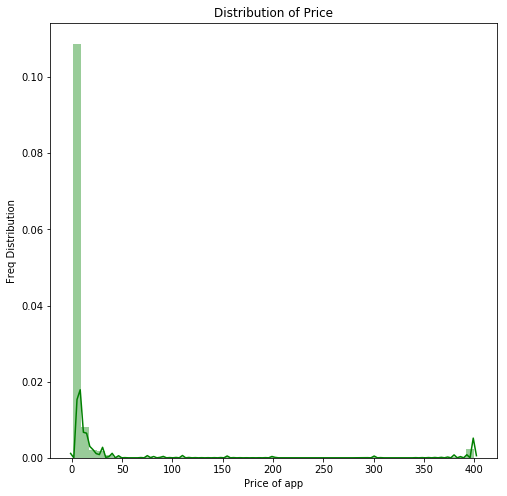

In [39]:
plt.figure(figsize=(8,8))
ax=sns.distplot(store.loc[store['Type']=='Paid',['Price']],color='green')
ax.set_xlabel("Price of app")
ax.set_ylabel("Freq Distribution")
ax.set_title("Distribution of Price")

The distribution is skewed towards right with most of the price of the apps falling between $ 0 - $ 50 .Lets check the most expensive apps.

In [45]:
exp_apps=store.loc[store['Type']=='Paid'].sort_values(by='Price',ascending=False)[0:10]
exp_apps[['App','Price']]

,App,Price
4367,I'm Rich - Trump Edition,400.00
4362,💎 I'm rich,399.99
5373,I AM RICH PRO PLUS,399.99
5356,I Am Rich Premium,399.99
5362,I Am Rich Pro,399.99
5369,I am Rich,399.99
5354,I am Rich Plus,399.99
5358,I am Rich!,399.99
5351,I am rich,399.99
5359,I am rich(premium),399.99


Text(0.5, 1.0, 'Most Expensive Apps')

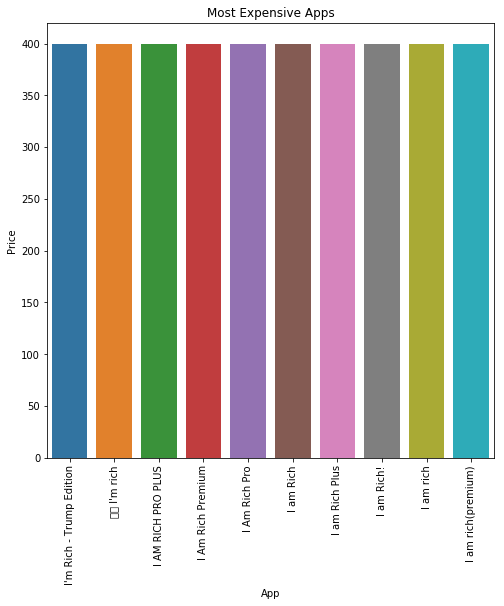

In [44]:
plt.figure(figsize=(8,8))
ax=sns.barplot(x='App',y='Price',data=exp_apps)
ax.set_xlabel('App')
ax.set_ylabel('Price')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_title("Most Expensive Apps")

All the top 10 apps are the same with different names - I am Rich !!! .

### Wordcloud of Reviews

Now that we have covered extensively on the app data lets turn out focus on the reviews for each app .On having a glimpse of the app earlier , we find that there are certain rows having NA values .For our analysis we remove those columns.

In [46]:
review.head()

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.53
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.29
2,10 Best Foods for You,NaN,NaN,nan,nan
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.88
4,10 Best Foods for You,Best idea us,Positive,1.00,0.30


In [48]:
review=review.dropna()

In [48]:
review.head()

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.53
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.29
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.88
4,10 Best Foods for You,Best idea us,Positive,1.00,0.30
5,10 Best Foods for You,Best way,Positive,1.00,0.30


Lets get a summary of the sentiments.

In [52]:
review['Sentiment'].value_counts()

Positive    23998
Negative     8271
Neutral      5158
Name: Sentiment, dtype: int64

We have an overwhelming positive sentiments in the app reviews.Lets create a wordcloud for each of those sentiments.

In [55]:
pos=review.loc[review['Sentiment']=='Positive']
neg=review.loc[review['Sentiment']=='Negative']
neu=review.loc[review['Sentiment']=='Neutral']

In [39]:
from wordcloud import WordCloud, STOPWORDS
import string
from nltk.stem import WordNetLemmatizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import *
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk import word_tokenize
eng_stopwords=set(stopwords.words('english'))

(-0.5, 399.5, 199.5, -0.5)

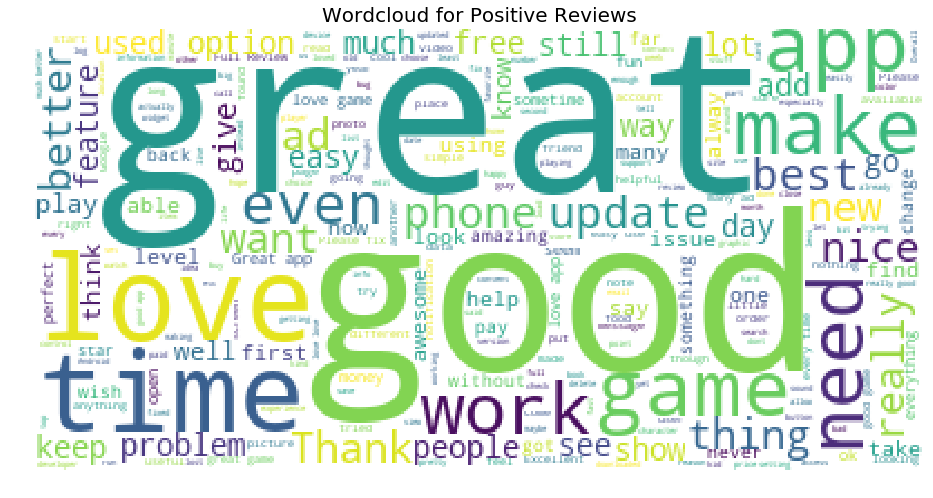

In [62]:
### Inspired from https://www.kaggle.com/arthurtok/spooky-nlp-and-topic-modelling-tutorial
plt.figure(figsize=(16,13))
wc = WordCloud(background_color="white", max_words=10000, 
            stopwords=STOPWORDS)
wc.generate(" ".join(pos['Translated_Review'].values))
plt.title("Wordcloud for Positive Reviews", fontsize=20)
plt.imshow(wc.recolor( colormap= 'viridis' , random_state=17), alpha=0.98)
plt.axis('off')

Great,love,time,good,work are most repeated words in the positive reviews.

(-0.5, 399.5, 199.5, -0.5)

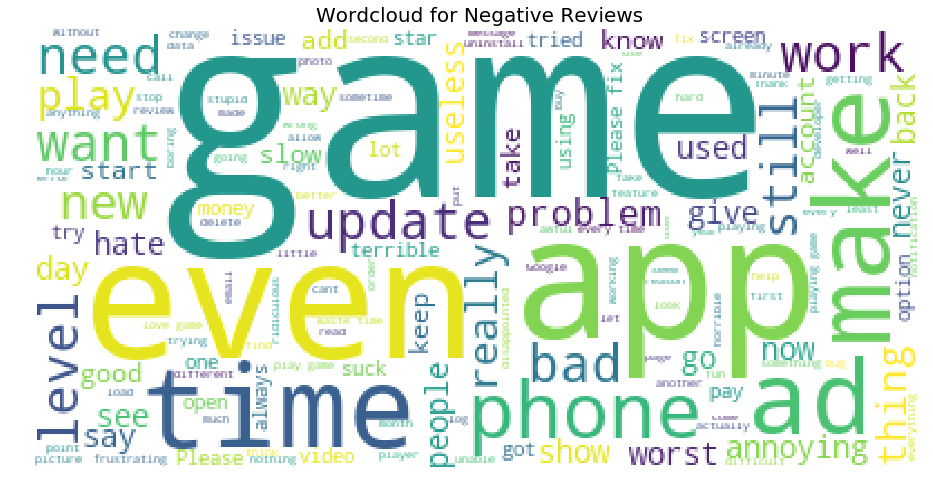

In [63]:
plt.figure(figsize=(16,13))
wc = WordCloud(background_color="white", max_words=10000, 
            stopwords=STOPWORDS)
wc.generate(" ".join(neg['Translated_Review'].values))
plt.title("Wordcloud for Negative Reviews", fontsize=20)
plt.imshow(wc.recolor( colormap= 'viridis' , random_state=17), alpha=0.98)
plt.axis('off')

game,update,problem,eve,time are some of the words most common in the negative review.

(-0.5, 399.5, 199.5, -0.5)

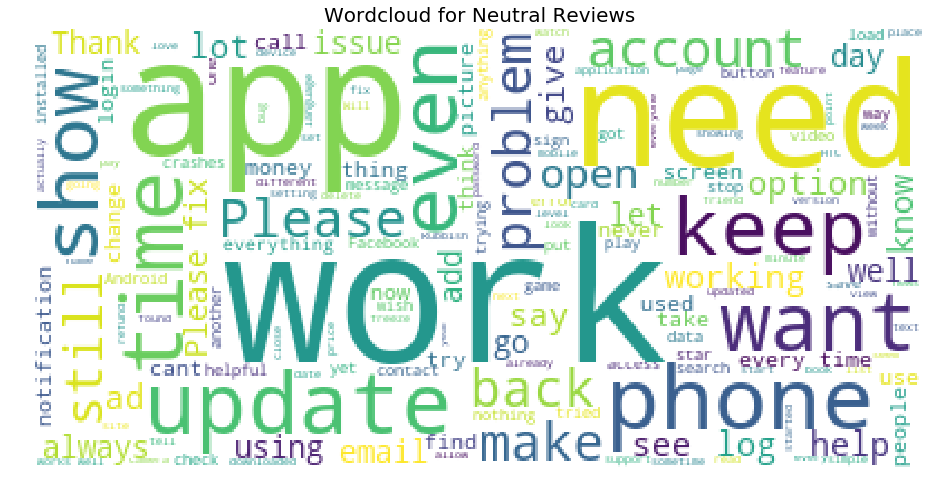

In [64]:
plt.figure(figsize=(16,13))
wc = WordCloud(background_color="white", max_words=10000, 
            stopwords=STOPWORDS)
wc.generate(" ".join(neu['Translated_Review'].values))
plt.title("Wordcloud for Neutral Reviews", fontsize=20)
plt.imshow(wc.recolor( colormap= 'viridis' , random_state=17), alpha=0.98)
plt.axis('off')

Neutral reviews have a mix of both words from positive and negative reviews.

### Difference between Positive ,Negative and Neutral Reviews

Lets find out the difference between positive,negative and neutral reviews by extracting the basic metafeatures - number of words,number of stopwords,number of unique words and number of punctuations in the sentence.

In [70]:
review['num_words']=review['Translated_Review'].apply(lambda x:len(str(x).split()))
review['num_stopwords']=review['Translated_Review'].apply(lambda x:len([w for w in str(x).lower().split() if w in eng_stopwords]))
review['num_punctuations']=review['Translated_Review'].apply(lambda x:len([w for w in str(x) if w in string.punctuation]))

To differentiate between the sentiment of the reviews , lets plot a violin plot .

Text(0.5, 1.0, 'Difference between the Number of Words Vs Sentiment')

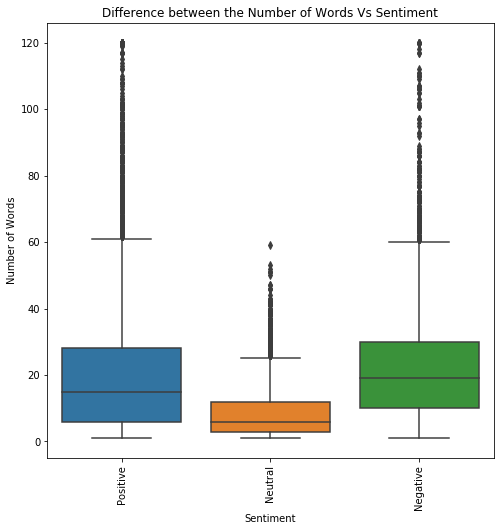

In [81]:
## For better visuals truncate words greater than 120 to 120
review['num_words'].loc[review['num_words']>120]=120

plt.figure(figsize=(8,8))
ax=sns.boxplot(x='Sentiment',y='num_words',data=review)
ax.set_xlabel('Sentiment')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylabel('Number of Words')
ax.set_title("Difference between the Number of Words Vs Sentiment")

The plot shows that the median number of words for a negative review is higher than the median for positive and neutral reviews . Also the mode for positive review is closer to 0 -20 range.

Text(0.5, 1.0, 'Difference between the Number of Stop Words Vs Sentiment')

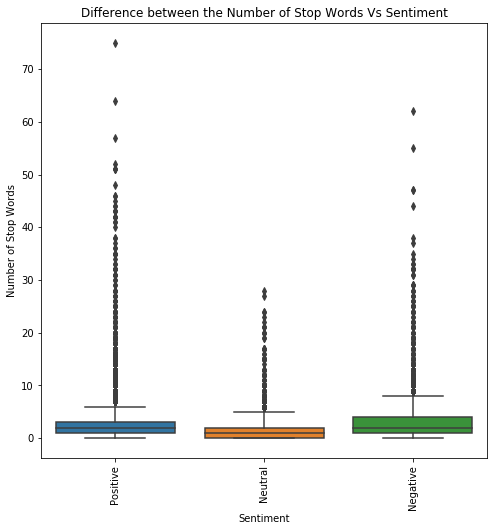

In [80]:

plt.figure(figsize=(8,8))
ax=sns.boxplot(x='Sentiment',y='num_stopwords',data=review)
ax.set_xlabel('Sentiment')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylabel('Number of Stop Words')
ax.set_title("Difference between the Number of Stop Words Vs Sentiment")

There is no significant difference between the setiment and number of stopwords used to express each sentiment.

Text(0.5, 1.0, 'Difference between the Number of Punctuations Vs Sentiment')

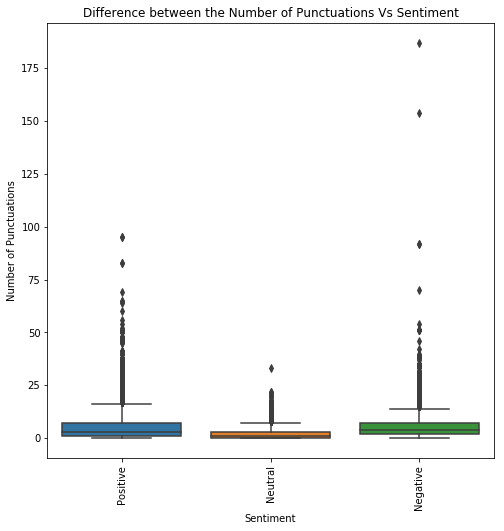

In [82]:
plt.figure(figsize=(8,8))
ax=sns.boxplot(x='Sentiment',y='num_punctuations',data=review)
ax.set_xlabel('Sentiment')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylabel('Number of Punctuations')
ax.set_title("Difference between the Number of Punctuations Vs Sentiment")

Similarly , the number of punctuations is not significantly different between the sentiments expressed .

### Review Analysis

In [97]:
### Inspired from - https://www.kaggle.com/residentmario/exploring-elon-musk-tweets

Let us define a function to tokenize a word and check the related reviews where that token appears .From this analysis , we would be able to see what people have to say on a particular token for an app . The tokens we would consider is - performance,battery , productivity,memory .For simplicity , we take the first 5 hits and output it.

This analysis could prove to be useful for app developers to understand the concerns that would be faced by the user of the app and modify the app accordingly

In [88]:
tokens=review['Translated_Review'].map(word_tokenize)

In [89]:
tokens.head()

0    [I, like, eat, delicious, food, ., That, 's, I...
1    [This, help, eating, healthy, exercise, regula...
3    [Works, great, especially, going, grocery, store]
4                                     [Best, idea, us]
5                                          [Best, way]
Name: Translated_Review, dtype: object

In [90]:
def get_reviews_on_token(x):
    x_l = x.lower()
    x_t = x.title()
    return review.loc[tokens.map(lambda sent: x_l in sent or x_t in sent).values]

In [101]:
get_reviews_on_token('Performance')[['App','Translated_Review']][0:5].values.tolist()


[['APUS Launcher - Theme, Wallpaper, Hide Apps',
  'Excessive updates without performance improvement'],
 ['Android Messages',
  'After recent update, I delete multiple messages, messages deleted unless I switch another app, sometimes I delete messages one. Very poor performance update'],
 ['App vault',
  "More useless, annoying often bit negative impact performance. Can't remove."],
 ['Asphalt 8: Airborne',
  'This game speechless many reasons say that. First, graphics, graphics breathtakingly beautiful isnt game better graphics. Second, performance, sure, lag thats normal! Other that, performance legendary, least me. Third, challenge. Hey, tough game, like it. Sure, game incredibly pay-to-win, dont really care! Overall, bit flaws best games ever played! Thank Gameloft, outstanding work!'],
 ['BBC Sport', 'slow, poor performance.']]

The output of the function is converted into a list with first index referring to the app and the second index is the review for that app containing the token 'performance'

In [100]:
get_reviews_on_token('memory')[['App','Translated_Review']][0:5].values.tolist()

[['8 Ball Pool',
  'Great game contains many bugs struck playing suggest many unnecessary displaying middle game ,today I played game even I game declared opponent winner . It eats ram internal memory cache makes smart phone lag.'],
 ['A+ Gallery - Photos & Videos',
  'I dropped rating! As last update I longer delete photos!! What happened?? I often take extra pics order choose right delete extra. Now I cannot delete memory filling unwanted unneeded pics!! Some I try delete multiplying!! PLEASE FIX back old version!! :('],
 ['AVG Cleaner – Speed, Battery & Memory Booster',
  "This says will. I free version mind ads free good app. My device Android tablet without 'clear memory' button; I restart that's slow, wonderful clears junk 60-90 seconds!"],
 ['AVG Cleaner – Speed, Battery & Memory Booster',
  'Since last 2 updates, memory hibernates 2 3 time. I constantly go back again...sometimes 10x...(no exaggeration)'],
 ['Adobe Acrobat Reader',
  'Not great anymore. Used good recent update. 

In [102]:
get_reviews_on_token('battery')[['App','Translated_Review']][0:5].values.tolist()

[['2GIS: directory & navigator',
  'Previously, the application was eating less battery, now the consumption is estimated by the phone as high intensive'],
 ['8 Ball Pool',
  'Funny game never see cue battery inside. You earn upgrades pay coins, stupid. But recharge cue u using stupid thing.back star keep asking rate game stil nothing improved. call pocket game. pot ball wrong pocket ball hand opponent lose turn'],
 ['8 Ball Pool',
  'Funny game never see cue battery inside. You earn upgrades pay coins, stupid. But recharge cue u using stupid thing.back star keep asking rate game stil nothing improved. call pocket game. pot ball wrong pocket ball hand opponent lose turn'],
 ['8 Ball Pool',
  'Funny game never see cue battery inside. You earn upgrades pay coins, stupid. But recharge cue u using stupid thing.back star keep asking rate game stil nothing improved. call pocket game. pot ball wrong pocket ball hand opponent lose turn'],
 ['8 Ball Pool',
  'Funny game never see cue battery in

In [103]:
get_reviews_on_token('productivity')[['App','Translated_Review']][0:5].values.tolist()

[['Amazon Shopping',
  'Hey, Jeff Bezos, employees living cars feeling suicidal poor work conditions written meet unrealistic productivity demands even much speak employees. All while, living mansion plan build rocketships billions make profits instead making sure employees well taken care of. How feel that? Do feel good yourself?'],
 ['Any.do: To-do list, Calendar, Reminders & Planner',
  'Wish still rewards completing tasks. I used reccomend increase productivity giving charities. Still good important aspect me.'],
 ['Any.do: To-do list, Calendar, Reminders & Planner',
  'Can add feature keeping count many task I completed analyse productivity'],
 ['FreshBooks Classic',
  "I like it, would like invoice control app. The time tracker invoice creation time savers productivity boosters! Needs way add unbilled hours client invoice phone app. Currently, I based version. The Freshbooks team seem little befuddled extended. I've made req... Full Review"],
 ['FreshBooks Classic',
  "I like it,

# Conclusion

Thus through the analysis of the dataset ,the following insights were mined :

* The average rating for the app stands at 4.5 and the number of reviews for the app is heavily biased for the apps which has seen the top ratings.
* There is no relationship between the rating and downloads .There is some other factor which makes people download and use the app.
* There are more free apps which has seen ~1 Bn downloads when compared to paid apps which has not seen the downloads crossing more than 10Mn.
* Average rating for Education , Art and Design,Entertainment,Game,Comic categories are above 4 whereas for Business the average rating has been less than 3.
* Average downloads for Communication , Video players and Social has been above 2 Mn whereas the average download for Events and Medical has been less than 0.5 Mn.
* While wordcloud gives a glimpse of most used words in the review , some words have been repeated in all the three sentiment polarities thereby we cant conclude anything on the reviews.
* An attempt was made to get the reviews which had a particular token to understand whether people have given positive or negative reviews for that app .
